# Fig. 2 Figure Supplement 1A

In [1]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import scipy as sp
import seaborn as sb

import matplotlib 
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
from matplotlib.axes._axes import _log as matplotlib_axes_logger
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.font_manager
matplotlib.rcParams['font.family'] = "Arial"
matplotlib.rc('xtick', labelsize=20) 
matplotlib.rc('ytick', labelsize=20) 

import scanpy as sc

In [2]:
# This ignores an annoying matplotlib error that comes up with the colors on a plot.
matplotlib_axes_logger.setLevel('ERROR')

# Set on Scanpy's verbose output
sc.settings.verbosity = 0   # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=300)

# Set directories for the data, results, and figures. SPECIFY AS APPROPRIATE
figdir = '../figures/'
datadir = '../../data/processed_data/'

Upload our analyzed dataset.

In [3]:
# Upload our analysis
adata = sc.read_h5ad(datadir + 'forelimb_10x.h5ad')

adata

AnnData object with n_obs × n_vars = 90637 × 4058
    obs: 'batch', 'stage', 'cell_type', 'tissue', 'n_genes', 'n_total_counts_per_cell', 'n_genes_per_cell', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden'
    var: 'n_cells', 'n_cells_per_gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In the integrated atlas, we generated clusters for the forelimb tissue by grouping each unique cell type and stage pair. We selected these clusters if they contained more than 30 cells.

In [4]:
# Group the labels by cell type + stage information
df = pd.DataFrame(adata.obs.groupby(["cell_type", "stage"]).size()).reset_index()

# Getting cell type + stage combos. with more than 30 cells
df = df[df[0] > 30]
df = df.reset_index()
df = df[["cell_type", "stage"]]

# Remove the annoying spaces in the cell type names from the author
lst_cell_type = {}
for i in df["cell_type"].unique():
    if i[-1] == " ":
        lst_cell_type[i] = i[:-1]

df["cell_type_old"] = df["cell_type"]
        
df["cell_type"] = df["cell_type"].replace(lst_cell_type)

df = df.sort_values(["cell_type", "stage"]).reset_index()

df.head()

,index,cell_type,stage,cell_type_old
0,0,Chondrocyte,12.0,Chondrocyte
1,1,Chondrocyte,13.0,Chondrocyte
2,2,Chondrocyte,13.5,Chondrocyte
3,3,Chondrocyte,14.0,Chondrocyte
4,4,Chondrocyte,15.0,Chondrocyte


We can import the metadata from the integrated atlas to match those annotations to the AnnData object that contains the forelimb scRNA-seq data.

In [5]:
# Import metadata
meta_data = pd.read_csv(datadir + "forelimb_meta_data.csv")

lst_age = []

for i in meta_data.index:
    lst_age.append(float(meta_data.loc[i]["age"][1:]))
    
meta_data["age"] = lst_age

meta_data = meta_data.sort_values(["cell_ontology_class", "age"]).reset_index()

df["Cell_class"] = meta_data["Cell_class"]

meta_data.head()

,index,Unnamed: 0,Tissue_old,cell_ontology_class,age,dataset,cell_id,seurat_clusters,Cell_class,Tissue
0,13,868_Forelimb_E10.5_15.0,forelimb,Chondrocyte,12.0,Forelimb_E10.5_15.0,868_Forelimb_E10.5_15.0,4,Connective,forelimb
1,23,878_Forelimb_E10.5_15.0,forelimb,Chondrocyte,13.0,Forelimb_E10.5_15.0,878_Forelimb_E10.5_15.0,4,Connective,forelimb
2,39,894_Forelimb_E10.5_15.0,forelimb,Chondrocyte,13.5,Forelimb_E10.5_15.0,894_Forelimb_E10.5_15.0,4,Connective,forelimb
3,53,908_Forelimb_E10.5_15.0,forelimb,Chondrocyte,14.0,Forelimb_E10.5_15.0,908_Forelimb_E10.5_15.0,4,Connective,forelimb
4,70,925_Forelimb_E10.5_15.0,forelimb,Chondrocyte,15.0,Forelimb_E10.5_15.0,925_Forelimb_E10.5_15.0,4,Connective,forelimb


We need to now map on the integrated cluster annotations onto the AnnData object and only keep single-cells that are in the integrated atlas clusters.

In [6]:
# Only keep the cells that fall into the correct cell type + stage categories
lst = []

for i in df.index:
    ct = df.loc[i]["cell_type_old"]
    age = df.loc[i]["stage"]
    
    lst.extend(list(adata[(adata.obs["cell_type"] == ct) & (adata.obs["stage"] == age)].obs.index))
    
adata_sub = adata[lst,]

# AnnData object of cells that are actually integrated
adata_sub

View of AnnData object with n_obs × n_vars = 90107 × 4058
    obs: 'batch', 'stage', 'cell_type', 'tissue', 'n_genes', 'n_total_counts_per_cell', 'n_genes_per_cell', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'n_counts', 'leiden'
    var: 'n_cells', 'n_cells_per_gene', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'cell_type_colors', 'leiden', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

We can add the `Cell_class` annotation onto single cells.

In [7]:
# Add the Cell_class annotation
lst_cell_class = []

for i in adata_sub.obs.index:
    j = adata_sub[i].obs
    ct = j["cell_type"].values[0]
    age = j["stage"].values[0]
    lst_cell_class.append(df[(df["cell_type_old"] == ct) & (df["stage"] == age)]["Cell_class"].values[0])
    
adata_sub.obs["Cell_class"] = lst_cell_class

Trying to set attribute `.obs` of view, copying.


We need to recompute the UMAP on our filtered AnnData object.

In [8]:
# Compute new connectivities on the data
sc.tl.umap(adata_sub)

### Author Cell Type Annotations

... storing 'Cell_class' as categorical


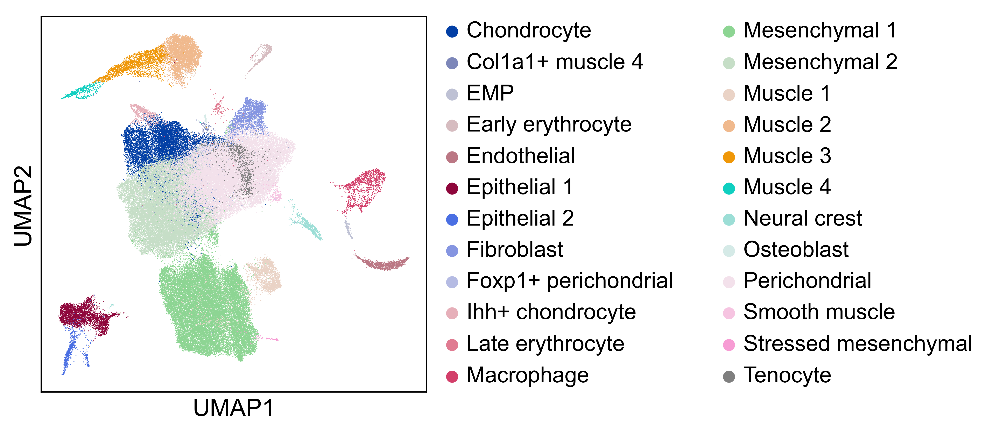

In [9]:
# Plot cell type
sc.pl.umap(adata_sub, color = ["cell_type"], title = "", show = False)

### Integrated Atlas `Cell_class` Annotations

In [10]:
# Import the Cell class colors
anno_df = pd.read_csv(datadir + "Cell_class_colors.csv")

sc.pl.umap(adata_sub, color = "Cell_class", show = False);
plt.close()

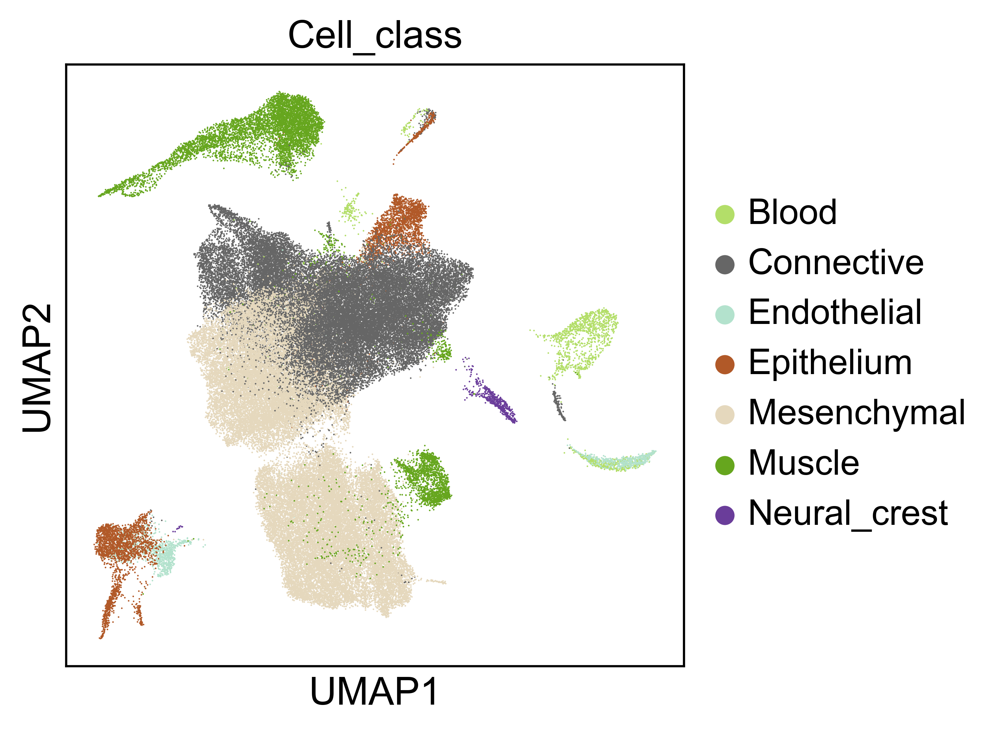

In [11]:
# Plot Cell_class
adata_sub.uns["Cell_class_colors"] = list(anno_df[anno_df["names"].isin(adata_sub.obs.Cell_class.cat.categories)]["colors"])
sc.pl.umap(adata_sub, color = "Cell_class", show = False)
plt.savefig(figdir+"Figure_2_figure_supplement_1A_Our_UMAP.pdf", bbox_inches="tight")

### Marker Gene Annotations

In [12]:
# Markers of interest
markers = ["Col3a1", "Myog", "Perp", "Gdf5"]

# Set seaborn color map for marker plots
my_cmap = sb.light_palette("Navy", as_cmap=True)

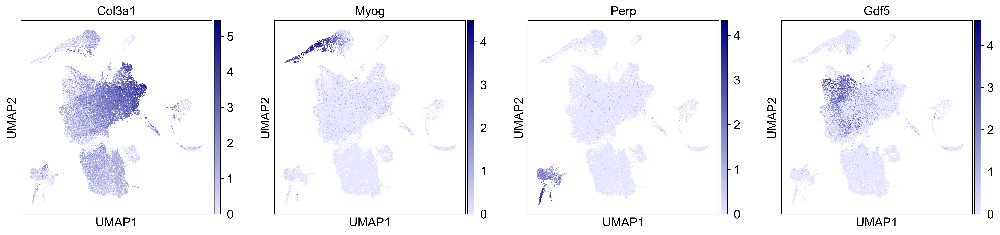

In [13]:
# Plot different marker genes
sc.pl.umap(adata_sub, color = markers, show=False, cmap = my_cmap)
plt.savefig(figdir+"Figure_2_figure_supplement_1A_Our_markers.pdf", bbox_inches="tight")

## He et al. Paper

We can import the He et al. analysis.

In [14]:
# Uploaded the He et al. analysis
adata_p = sc.read_h5ad(datadir+'200120_10x.h5ad')

adata_p

AnnData object with n_obs × n_vars = 90637 × 43346
    obs: 'batch', 'doublet_scores', 'nCount_RNA', 'nFeatures_RNA', 'percent_mito', 'stage', 'cell_type', 'n_counts', 'doublet_corrected_p', 'doublet_corrected_p_less_than_0_1'
    var: 'gene_id'
    uns: 'batch_colors', 'cell_type_colors', 'doublet_corrected_p_less_than_0_1_colors', 'stage_colors'
    obsm: 'X_tsne', 'X_umap'

### Author Cell Type Annotations

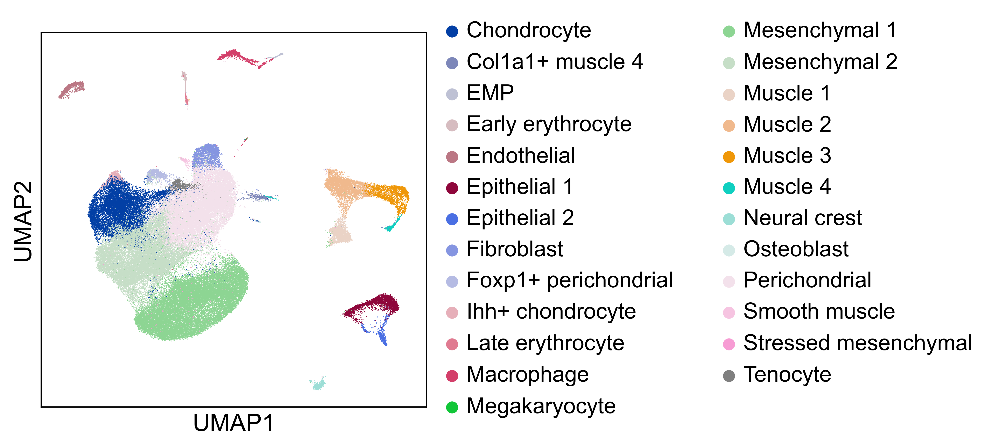

In [15]:
# Plot cell type
sc.pl.umap(adata_p, color = ["cell_type"], title = "", show=False)
plt.savefig(figdir+"Figure_2_figure_supplement_1A_He_UMAP.pdf", bbox_inches="tight")

### Marker Gene Annotations

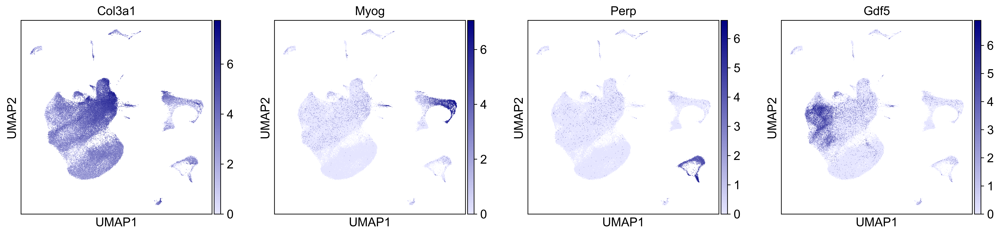

In [16]:
# Plot marker expression
sc.pl.umap(adata_p, color=markers, show=False, cmap = my_cmap)#, color_map=my_cmap,ax=ax)
plt.savefig(figdir+"Figure_2_figure_supplement_1A_He_markers.pdf", bbox_inches="tight")